# Análisis de Kernels de Convolución/Correlación en Imágenes 2D

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import convolve

In [54]:
def get_bscan(tomogram: np.ndarray, bscan_idx: int = None):
    """
    Retrieves a B-scan (cross-section) from an OCT tomogram.
    """
    # Handle Complex Field Data -> Get Magnitude
    if np.iscomplexobj(tomogram):
        mag = np.abs(tomogram)
    elif tomogram.ndim == 4 and tomogram.shape[-1] == 2:
        # Format used in your codebase: [Depth, X, Y, Channels (Re, Im)]
        mag = np.sqrt(tomogram[..., 0]**2 + tomogram[..., 1]**2)
    else:
        mag = tomogram

    # Logarithmic Scaling (Decibel scale)
    # Add a small epsilon (1e-8) to prevent log10(0) warnings
    db_tomogram = 20 * np.log10(mag + 1e-8)

    # Create the views
    # Determine the middle slice for the B-scan if not specified
    if bscan_idx is None:
        bscan_idx = db_tomogram.shape[2] // 2 

    # B-scan: Depth (Z) vs Fast Axis (X) at a specific Slow Axis (Y) index
    b_scan = db_tomogram[:, :, bscan_idx]

    return b_scan



## Datos a Utilizar
-> Para evaluar el efecto que tienen los kernels vamos a utilizar dos imágenes de prueba. Un B-SCAN de un tomograma de OCT en intensidad, y una imágen tradicional

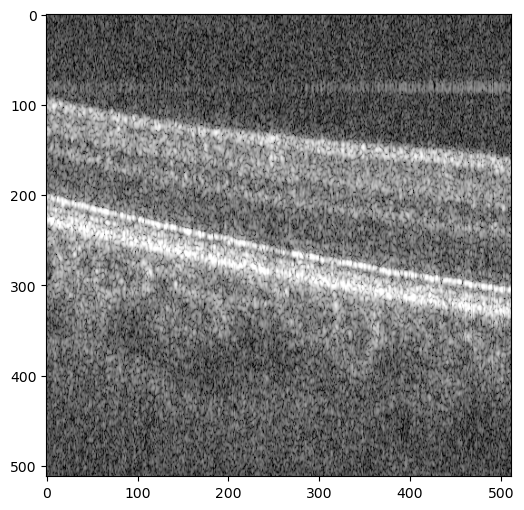

In [55]:
# Tomograma de OCT
oct_tom = np.load("C:\\Users\\jcosp\\dev\\dloct-thesis\\data\\train\\phase\\S.Eye2A.npy") 
bscan = get_bscan(oct_tom, bscan_idx=40)
vmin = np.percentile(bscan, 1)    # Bottom 1% (Noise floor)
vmax = np.percentile(bscan, 99.5) # Top 0.5% (Specular reflections)


plt.figure(figsize=(6, 6))
plt.imshow(bscan, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)


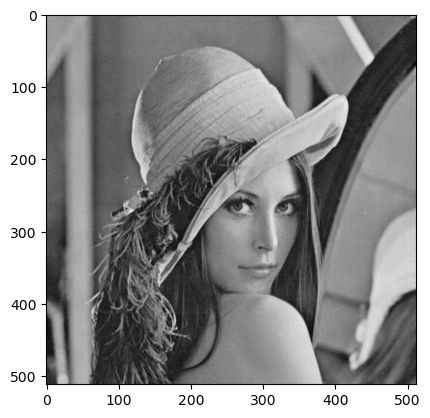

In [56]:
lena = np.array(Image.open("C:\\Users\\jcosp\\dev\\dloct-thesis\\data\\Original_lena512.jpg"))
plt.imshow(lena, cmap='gray')

## 1) Creación de los Kernels

In [67]:

def make_kernels_2d(size=49):
    """Generate a library of 2-D spatial kernels (filters)."""
    c = size // 2
    ys, xs = np.ogrid[:size, :size]
    r2 = (xs - c)**2 + (ys - c)**2
    r  = np.sqrt(r2).astype(float)
    theta = np.arctan2(ys-c, xs-c)

    kernels = {}

    # Gaussian blur
    for s in [1.0, 2.5]:
        g = np.exp(-r2 / (2*s**2))
        kernels[f"Gaussian σ={s}"] = g / g.max()

    # Laplacian of Gaussian (blob detector)
    s = 2.0
    log_k = -(1/s**4) * (r2 - 2*s**2) * np.exp(-r2/(2*s**2))
    kernels["LoG (blob)"] = log_k / np.abs(log_k).max()

    # Sobel edge detectors
    sx = np.zeros((size, size)); sy = np.zeros((size, size))
    if size >= 3:
        sx[c-1:c+2, c-1:c+2] = [[-1,0,1],[-2,0,2],[-1,0,1]]
        sy[c-1:c+2, c-1:c+2] = [[-1,-2,-1],[0,0,0],[1,2,1]]
    kernels["Sobel X"] = sx
    kernels["Sobel Y"] = sy

    # Mexican hat / Ricker 2D
    mh = (1 - r2/2) * np.exp(-r2/4)
    kernels["Mexican hat 2D"] = mh / np.abs(mh).max()

    # Gabor filters (2D)
    for angle in [0, 45, 90]:
        angle_r = np.deg2rad(angle)
        xr = (xs-c)*np.cos(angle_r) + (ys-c)*np.sin(angle_r)
        yr = -(xs-c)*np.sin(angle_r) + (ys-c)*np.cos(angle_r)
        gb = np.exp(-(xr**2 + yr**2*4)/(2*3**2)) * np.cos(2*np.pi*xr/8)
        kernels[f"Gabor {angle}°"] = gb / np.abs(gb).max()

    # Disk (average)
    disk = (r <= c*0.5).astype(float)
    disk /= disk.sum() + 1e-12
    kernels["Disk avg."] = disk / disk.max()

    # Prewitt
    px = np.zeros((size,size)); py = np.zeros((size,size))
    if size >= 3:
        px[c-1:c+2,c-1:c+2] = [[-1,0,1],[-1,0,1],[-1,0,1]]
        py[c-1:c+2,c-1:c+2] = [[-1,-1,-1],[0,0,0],[1,1,1]]
    kernels["Prewitt X"] = px
    kernels["Prewitt Y"] = py

    # Sharpening
    sharp = np.zeros((size,size))
    if size >= 3:
        sharp[c-1:c+2,c-1:c+2] = [[0,-1,0],[-1,5,-1],[0,-1,0]]
    kernels["Sharpen"] = sharp

    # Emboss
    emboss = np.zeros((size,size))
    if size >= 3:
        emboss[c-1:c+2,c-1:c+2] = [[-2,-1,0],[-1,1,1],[0,1,2]]
    kernels["Emboss"] = emboss

    # Directional derivatives (DoG variants)
    log2 = -(1/1**4)*(r2-2*1**2)*np.exp(-r2/(2*1**2))
    kernels["DoG fine"] = log2 / (np.abs(log2).max()+1e-12)

    # Banana / elongated Gaussian
    s_maj, s_min = 3.5, 1.0
    xr = (xs-c)*np.cos(np.pi/6) + (ys-c)*np.sin(np.pi/6)
    yr = -(xs-c)*np.sin(np.pi/6) + (ys-c)*np.cos(np.pi/6)
    elong = np.exp(-(xr**2/(2*s_maj**2) + yr**2/(2*s_min**2)))
    kernels["Elongated Gaussian"] = elong / elong.max()

    return kernels


def apply_kernel_2d(image, kernel):
    """Correlate 2-D image with kernel via 2-D FFT."""
    Kh, Kw = kernel.shape
    Ih, Iw = image.shape
    ph, pw = Kh//2, Kw//2
    padded = np.pad(image, ((ph,ph),(pw,pw)), mode="reflect")
    return np.real(np.fft.ifft2(
        np.conj(np.fft.fft2(kernel, padded.shape)) *
        np.fft.fft2(padded)))[ph:ph+Ih, pw:pw+Iw]



In [58]:
kernels = make_kernels_2d(size=49)

## 2) Función para visualizar los filtros junto a las imágenes

In [99]:
# Plot Helper Functions 
def plot_kernel_results(kernel: np.ndarray, lena_result: np.ndarray, tomo_result: np.ndarray):
    """
    Helper function to plot the kernel and both resulting images side-by-side.
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # 1. The Kernel
    axes[0].imshow(kernel, cmap='coolwarm')
    axes[0].set_title("Kernel Matrix")
    axes[0].axis('off')
    
    # 2. Filtered Lena
    axes[1].imshow(lena_result, cmap='gray')
    axes[1].set_title("Lena")
    axes[1].axis('off')
    
    # 3. Filtered Tomogram (Using percentiles to handle edge-detector dynamic ranges!)
    vmin, vmax = np.percentile(tomo_result, (2, 98))
    axes[2].imshow(tomo_result, cmap='gray', vmin=vmin, vmax=vmax)
    axes[2].set_title("Tomogram")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

In [100]:
def plot_kernel_results_surface(kernel: np.ndarray, lena_result: np.ndarray, tomo_result: np.ndarray):
    """
    Plots the 2D kernel and resulting images as 3D intensity surfaces.
    """
    # Create figure and 3D subplots
    fig = plt.figure(figsize=(18, 6))
    axes = [fig.add_subplot(1, 3, i, projection='3d') for i in range(1, 4)]
    
    # --- 1. Plot the Kernel Surface ---
    h_k, w_k = kernel.shape
    X_k, Y_k = np.meshgrid(np.arange(w_k), np.arange(h_k))
    
    abs_max = np.max(np.abs(kernel))
    if abs_max == 0: abs_max = 1e-8
    
    axes[0].plot_surface(X_k, Y_k, kernel, cmap='coolwarm', vmin=-abs_max, vmax=abs_max, 
                         edgecolor='none', antialiased=False)
    axes[0].set_title("Kernel Intensity Surface")
    
    # --- 2. Plot Lena Surface ---
    # We use rstride and cstride to downsample the meshgrid rendering. 
    # Plotting a raw 512x512 surface is 262,144 polygons and will lag/crash Matplotlib!
    h_l, w_l = lena_result.shape
    X_l, Y_l = np.meshgrid(np.arange(w_l), np.arange(h_l))
    
    axes[1].plot_surface(X_l, Y_l, lena_result, cmap='gray', 
                         rstride=4, cstride=4, edgecolor='none', antialiased=False)
    axes[1].set_title("Lena Result Surface")
    
    # --- 3. Plot Tomogram Surface ---
    h_t, w_t = tomo_result.shape
    X_t, Y_t = np.meshgrid(np.arange(w_t), np.arange(h_t))
    
    # For the tomogram, a single specular reflection might be 1000x taller than the tissue.
    # We physically clip the Z-data so the graph doesn't just look like a single massive spike.
    vmin, vmax = np.percentile(tomo_result, (2, 98))
    tomo_clipped = np.clip(tomo_result, vmin, vmax)
    
    axes[2].plot_surface(X_t, Y_t, tomo_clipped, cmap='gray', 
                         rstride=4, cstride=4, edgecolor='none', antialiased=False)
    axes[2].set_title("Tomogram Result Surface")
    
    # Clean up the axes viewing angles
    for ax in axes:
        # Tweak the viewing angle (elevation, azimuth) for a good perspective
        ax.view_init(elev=45, azim=-45)
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Intensity")
        
        # Optional: Hide the pane background to make the surface pop more
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False

    plt.tight_layout()
    plt.show()


In [106]:
def plot_kernel_results_surface_normalized(kernel: np.ndarray, lena_result: np.ndarray, tomo_result: np.ndarray):
    """
    Plots the 2D kernel and resulting images as 3D intensity surfaces,
    with the Z-axis strictly normalized.
    """
    fig = plt.figure(figsize=(18, 6))
    axes = [fig.add_subplot(1, 3, i, projection='3d') for i in range(1, 4)]
    
    # --- 1. Normalize and Plot Kernel (Scaled from -1 to 1) ---
    abs_max = np.max(np.abs(kernel))
    if abs_max == 0: abs_max = 1e-8
    kernel_norm = kernel / abs_max  
    
    h_k, w_k = kernel_norm.shape
    X_k, Y_k = np.meshgrid(np.arange(w_k), np.arange(h_k))
    
    axes[0].plot_surface(X_k, Y_k, kernel_norm, cmap='coolwarm', vmin=-1, vmax=1, 
                         edgecolor='none', antialiased=False)
    axes[0].set_title("Kernel Surface\n(Normalized [-1, 1])")
    axes[0].set_zlim(-1, 1) # Lock the Z-axis
    
    # --- 2. Normalize and Plot Lena (Scaled from 0 to 1) ---
    lena_min, lena_max = np.min(lena_result), np.max(lena_result)
    lena_norm = (lena_result - lena_min) / (lena_max - lena_min + 1e-8) 
    
    h_l, w_l = lena_norm.shape
    X_l, Y_l = np.meshgrid(np.arange(w_l), np.arange(h_l))
    
    axes[1].plot_surface(X_l, Y_l, lena_norm, cmap='gray', 
                         rstride=4, cstride=4, edgecolor='none', antialiased=False)
    axes[1].set_title("Lena Surface\n(Normalized [0, 1])")
    axes[1].set_zlim(0, 1) # Lock the Z-axis
    
    # --- 3. Normalize and Plot Tomogram (Scaled from 0 to 1) ---
    # We still clip the outliers first so the normalization isn't ruined by a single bright pixel
    vmin, vmax = np.percentile(tomo_result, (2, 98))
    tomo_clipped = np.clip(tomo_result, vmin, vmax)
    tomo_norm = (tomo_clipped - vmin) / (vmax - vmin + 1e-8) 
    
    h_t, w_t = tomo_norm.shape
    X_t, Y_t = np.meshgrid(np.arange(w_t), np.arange(h_t))
    
    axes[2].plot_surface(X_t, Y_t, tomo_norm, cmap='gray', 
                         rstride=4, cstride=4, edgecolor='none', antialiased=False)
    axes[2].set_title("Tomogram Surface\n(Normalized [0, 1])")
    axes[2].set_zlim(0, 1) # Lock the Z-axis
    
    # Clean up the viewing angles and labels
    for ax in axes:
        ax.view_init(elev=45, azim=-45)
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Normalized Intensity")
        
        # Hide the pane background to make the surface pop more
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False

    plt.tight_layout()
    plt.show()

In [68]:
kernels.keys()

dict_keys(['Gaussian σ=1.0', 'Gaussian σ=2.5', 'LoG (blob)', 'Sobel X', 'Sobel Y', 'Mexican hat 2D', 'Gabor 0°', 'Gabor 45°', 'Gabor 90°', 'Disk avg.', 'Prewitt X', 'Prewitt Y', 'Sharpen', 'Emboss', 'DoG fine', 'Elongated Gaussian'])

## Aplicación de Filtros

### Filtro Gaussiano
Filtro pasabajas que suaviza la imagen atenuando las altas frecuencias. El parámetro $\sigma$ controla la dispersión: $\sigma=1.0$ preserva más detalles estructurales, mientras que $\sigma=2.5$ aplica un desenfoque mayor.
$$G(x,y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2+y^2}{2\sigma^2}}$$

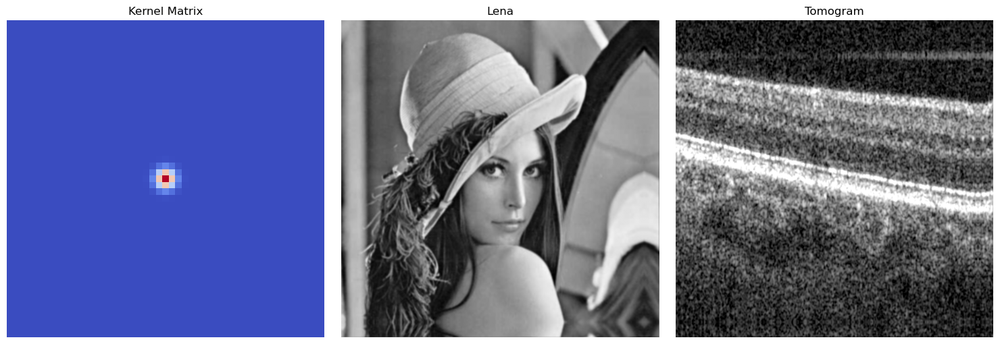

In [111]:
# Grab the specific kernel
kernel = kernels["Gaussian σ=1.0"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


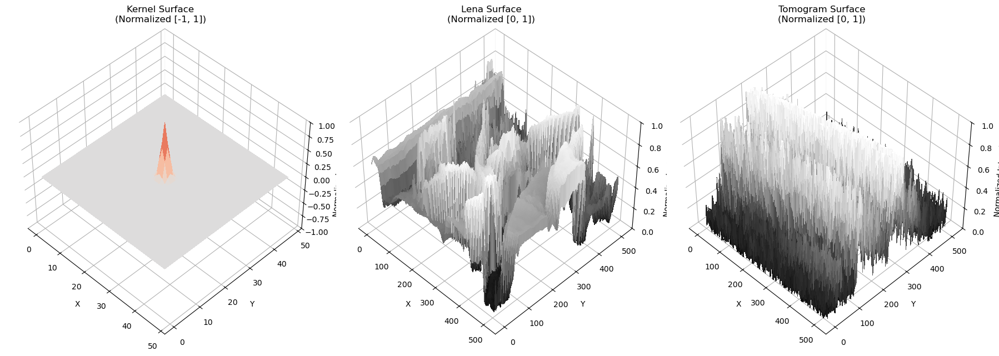

In [112]:
plot_kernel_results_surface_normalized(kernel, lena_filtered, tomo_filtered)

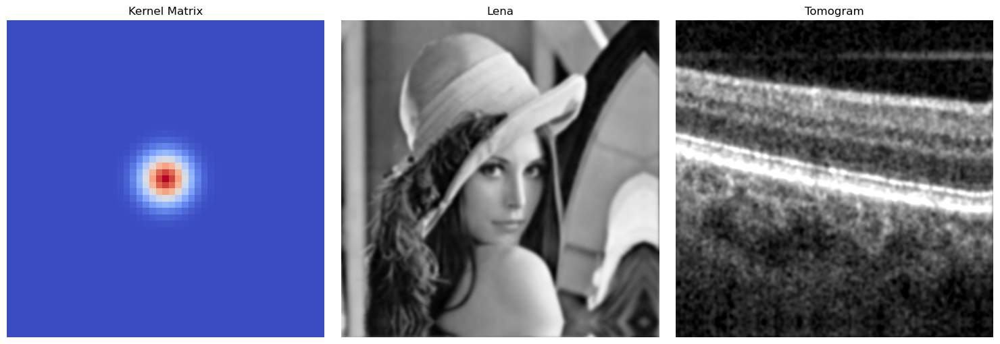

In [113]:
# Grab the specific kernel
kernel = kernels["Gaussian σ=2.5"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


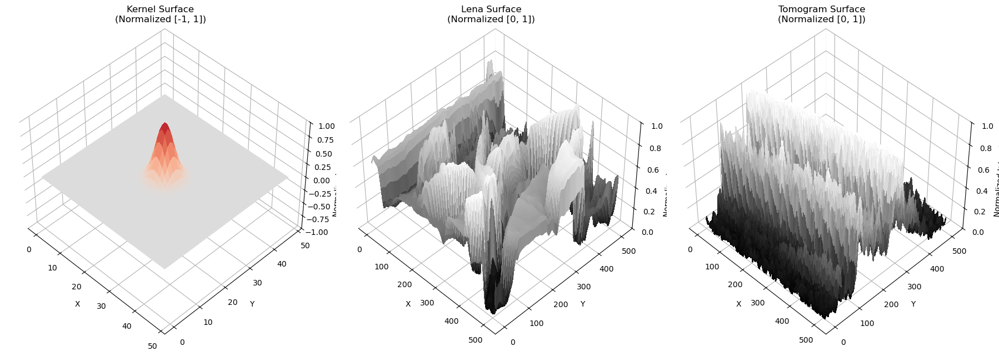

In [114]:
plot_kernel_results_surface_normalized(kernel, lena_filtered, tomo_filtered)

### Laplaciano del Gaussiano
El Laplaciano del Gaussiano es un filtro isótropo de paso banda. Calcula la segunda derivada espacial de la imagen suavizada, lo que lo hace excelente para detectar "blobs" (regiones circulares de contraste) y delinear discontinuidades abruptas.
$$\nabla^2 G(x,y) \propto \left(1 - \frac{x^2+y^2}{\sigma^2}\right) e^{-\frac{x^2+y^2}{2\sigma^2}}$$

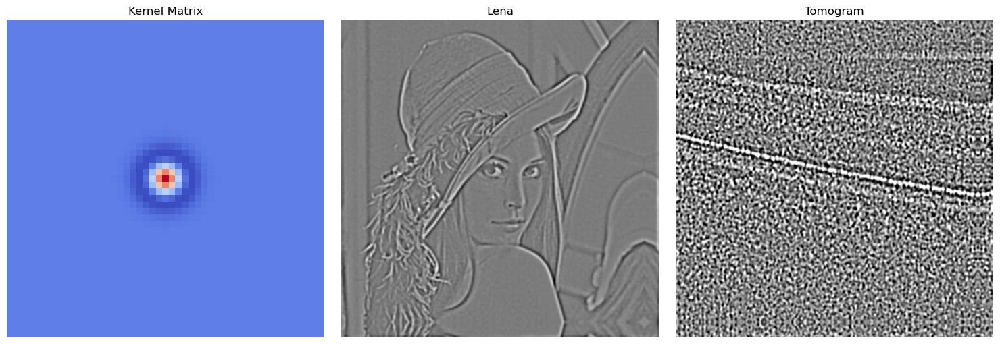

In [115]:
# Grab the specific kernel
kernel = kernels["LoG (blob)"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


In [ ]:
plot_kernel_results_surface_normalized(kernel, lena_filtered, tomo_filtered)

### Filtro Sobel (X y Y)
Operadores de primera derivada para estimar el gradiente espacial (detección de bordes). Los filtros X detectan transiciones horizontales (bordes verticales), y los Y detectan transiciones verticales. Sobel da más peso al píxel central para mayor robustez al ruido, mientras que Prewitt promedia uniformemente.

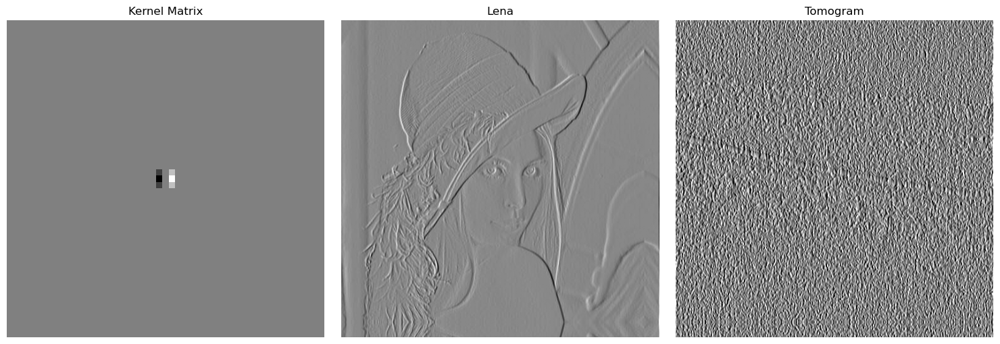

In [ ]:
# Grab the specific kernel
kernel = kernels["Sobel X"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


In [ ]:
plot_kernel_results_surface_normalized(kernel, lena_filtered, tomo_filtered)

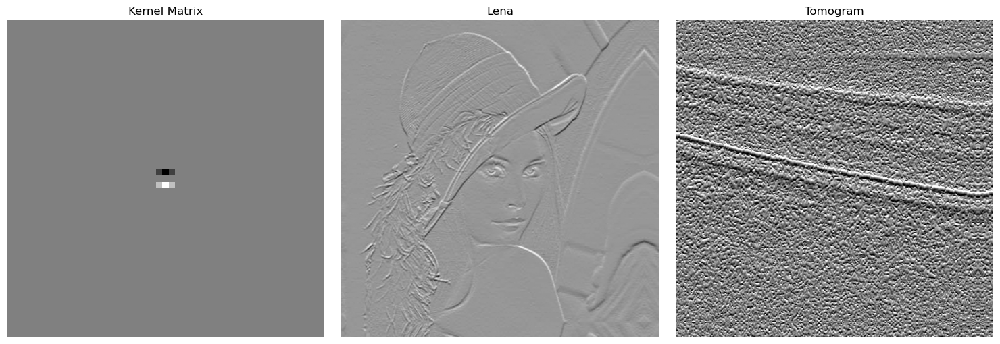

In [ ]:
# Grab the specific kernel
kernel = kernels["Sobel Y"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


### Mexican hat 2D

In [75]:
kernels.keys()

dict_keys(['Gaussian σ=1.0', 'Gaussian σ=2.5', 'LoG (blob)', 'Sobel X', 'Sobel Y', 'Mexican hat 2D', 'Gabor 0°', 'Gabor 45°', 'Gabor 90°', 'Disk avg.', 'Prewitt X', 'Prewitt Y', 'Sharpen', 'Emboss', 'DoG fine', 'Elongated Gaussian'])

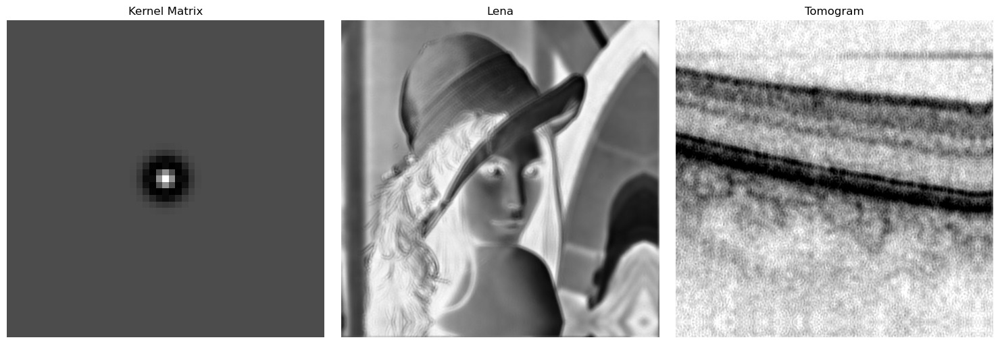

In [98]:
## Mexican hat 2D
# Grab the specific kernel
kernel = kernels["Mexican hat 2D"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


### Filtro Gabor ($\theta$)
Es un filtro gaussiano modulado por una onda sinusoidal, fundamental para la resolución conjunta en el dominio espacial y de frecuencias. Es altamente sensible a variaciones periódicas (texturas) en ángulos específicos (0°, 45°, 90°), ideal para analizar señales direccionales.
$$g(x,y) = \exp\left(-\frac{x'^2 + \gamma^2 y'^2}{2\sigma^2}\right) \cos\left(2\pi \frac{x'}{\lambda} + \psi\right)$$

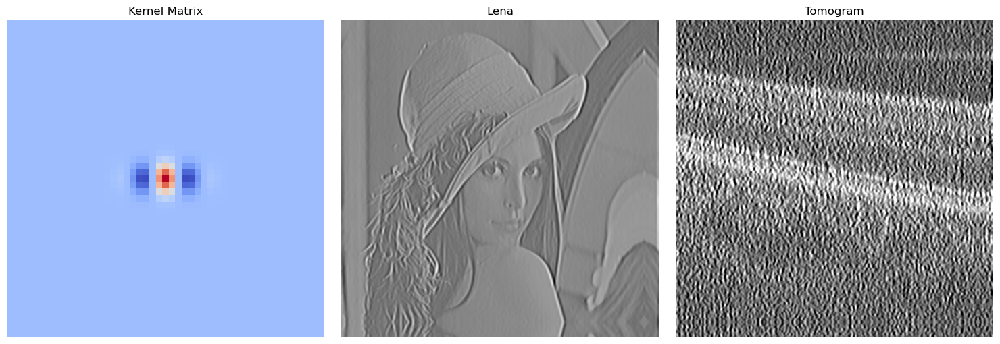

In [77]:
# Grab the specific kernel
kernel = kernels["Gabor 0°"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


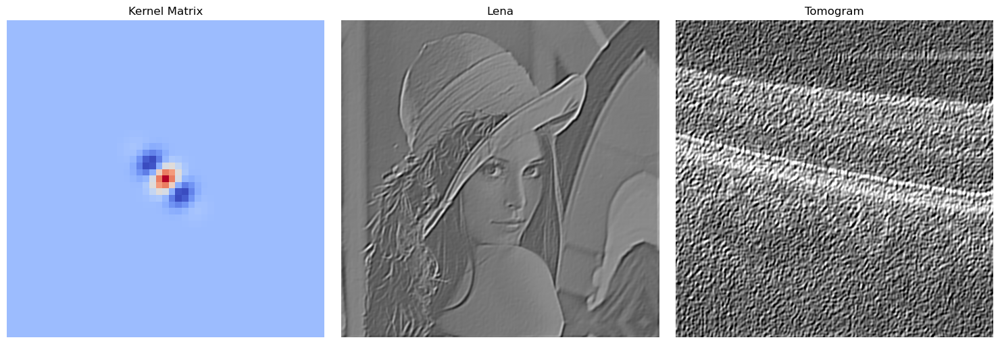

In [78]:
# Grab the specific kernel
kernel = kernels["Gabor 45°"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)

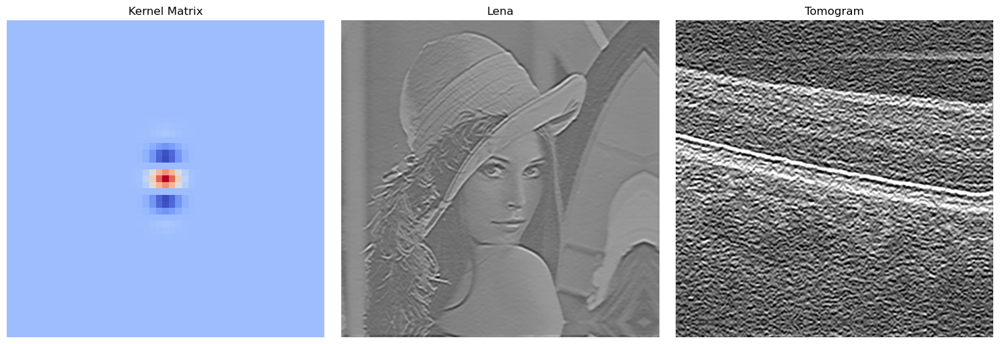

In [79]:
# Grab the specific kernel
kernel = kernels["Gabor 90°"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)

In [80]:
kernels.keys()

dict_keys(['Gaussian σ=1.0', 'Gaussian σ=2.5', 'LoG (blob)', 'Sobel X', 'Sobel Y', 'Mexican hat 2D', 'Gabor 0°', 'Gabor 45°', 'Gabor 90°', 'Disk avg.', 'Prewitt X', 'Prewitt Y', 'Sharpen', 'Emboss', 'DoG fine', 'Elongated Gaussian'])

### Disk Avg. 
Filtro de suavizado uniforme (pasabajas). A diferencia de la campana suave del Gaussiano, aplica exactamente el mismo peso a todos los píxeles dentro de un radio circular definido, produciendo un desenfoque con un corte de frecuencia más rígido.

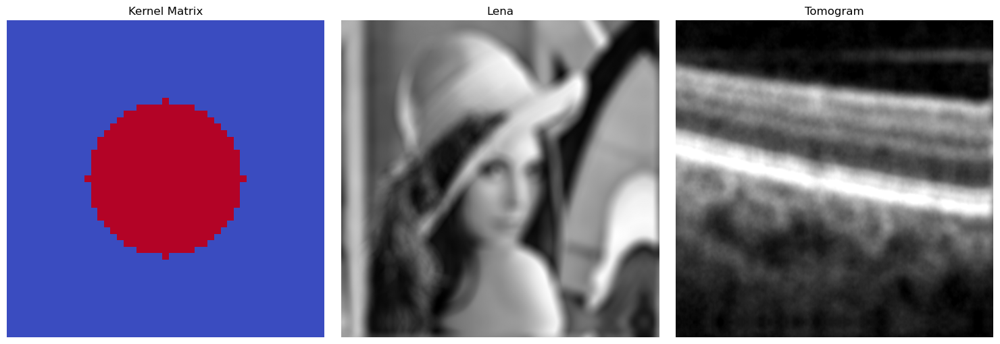

In [81]:
# Grab the specific kernel
kernel = kernels["Disk avg."]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


### Prewitt (X y Y)

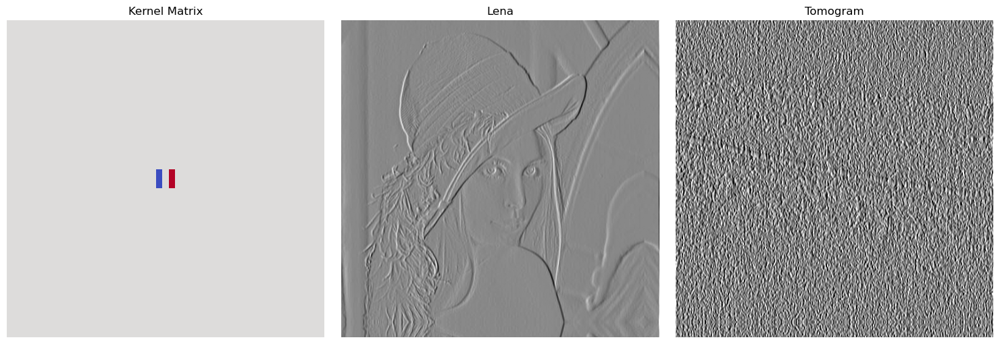

In [82]:
# Grab the specific kernel
kernel = kernels["Prewitt X"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


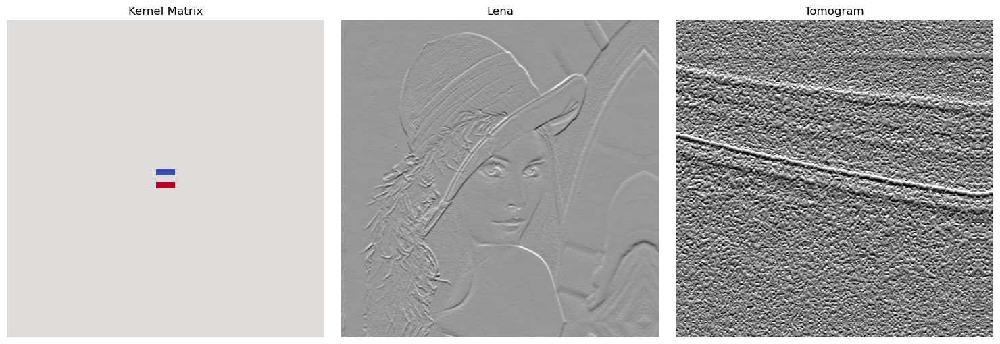

In [83]:
# Grab the specific kernel
kernel = kernels["Prewitt Y"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


### Sharpen
Realza las altas frecuencias y los micro-detalles. Usualmente se logra restando una versión suavizada (pasabajas) de la imagen original para amplificar el contraste en los bordes y las interfaces.

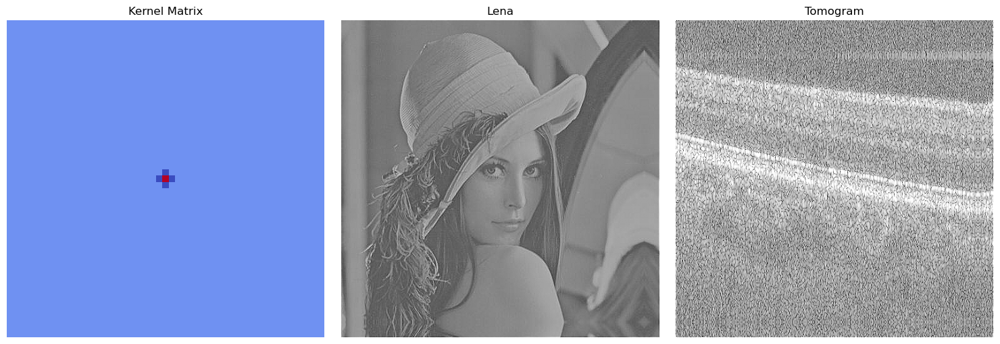

In [84]:
# Grab the specific kernel
kernel = kernels["Sharpen"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


### Emboss
Filtro direccional que simula iluminación en 3D. Calcula las diferencias de intensidad en una dirección específica y les suma un valor constante (usualmente gris medio), mapeando los gradientes topográficos de la imagen en sombras y luces.

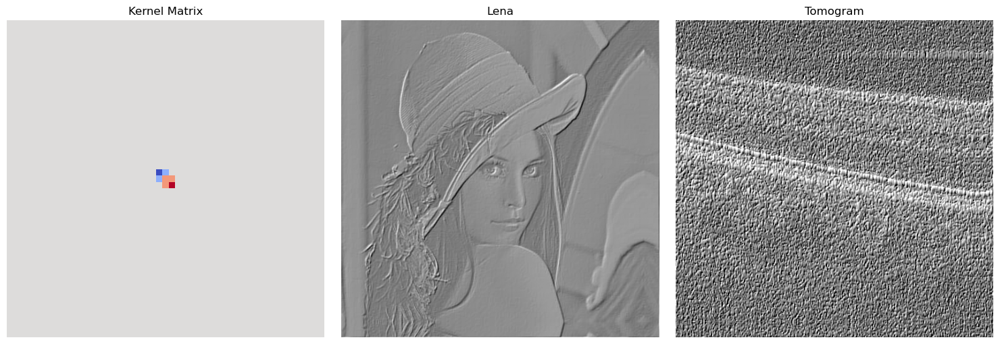

In [85]:
# Grab the specific kernel
kernel = kernels["Emboss"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


In [86]:
kernels.keys()

dict_keys(['Gaussian σ=1.0', 'Gaussian σ=2.5', 'LoG (blob)', 'Sobel X', 'Sobel Y', 'Mexican hat 2D', 'Gabor 0°', 'Gabor 45°', 'Gabor 90°', 'Disk avg.', 'Prewitt X', 'Prewitt Y', 'Sharpen', 'Emboss', 'DoG fine', 'Elongated Gaussian'])

### Dog Fine
Actúa como un filtro de paso banda muy estrecho diseñado específicamente para extraer microestructuras y detalles de alta frecuencia. Se obtiene restando dos versiones de la imagen suavizadas con parámetros $\sigma$ muy pequeños y cercanos entre sí
$$DoG(x,y) = G_{\sigma_1}(x,y) - G_{\sigma_2}(x,y)$$

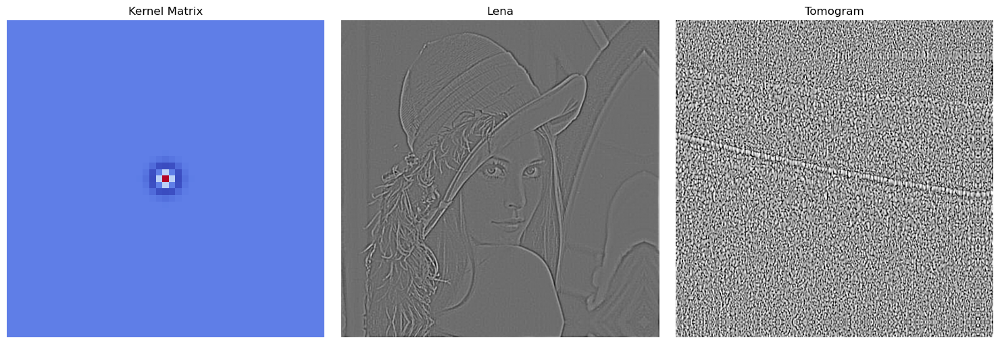

In [87]:
# Grab the specific kernel
kernel = kernels["DoG fine"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)


### Elongated Gaussian
Filtro de suavizado anisotrópico. Utiliza diferentes desviaciones estándar para los ejes espaciales ($\sigma_x \neq \sigma_y$). Es muy útil para suavizar a lo largo de estructuras continuas (como capas de tejido o líneas) sin destruir los bordes transversales a ellas.

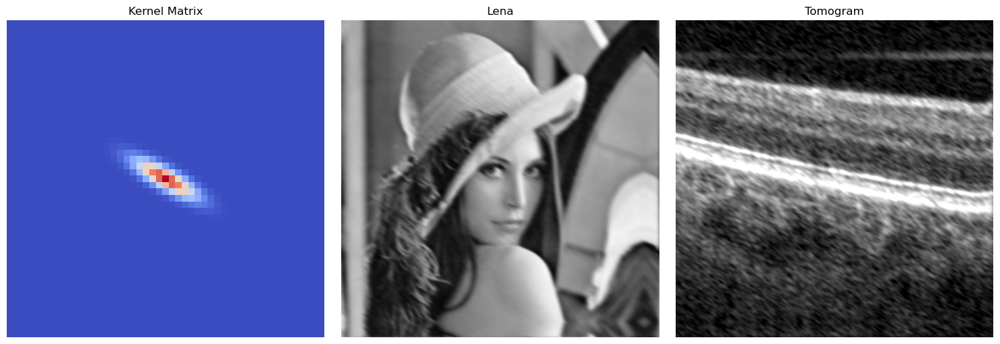

In [88]:
# Grab the specific kernel
kernel = kernels["Elongated Gaussian"]

# Apply it (assuming tomogram_db is already log-scaled)
lena_filtered = apply_kernel_2d(lena, kernel)
tomo_filtered = apply_kernel_2d(bscan, kernel)

# Plot the results
plot_kernel_results(kernel, lena_filtered, tomo_filtered)
